In [1]:
from tensorflow.keras.datasets import cifar10

In [2]:
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
print(X_train.shape, X_test.shape)
# tesnsorflow는 배치, w, h, 채널 순서이고 pytorch는 채널, w, h, 배치 순서이다.

(50000, 32, 32, 3) (10000, 32, 32, 3)


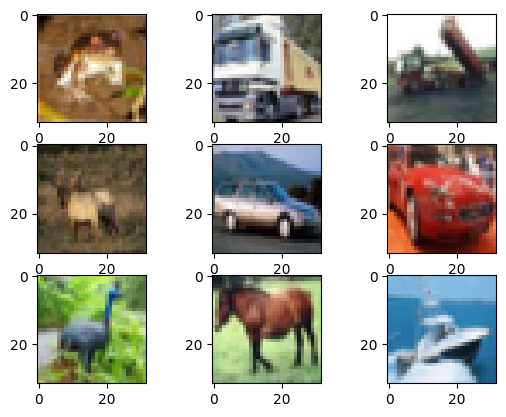

In [3]:
import matplotlib.pyplot as plt
import numpy as np

for temp in range(9):
    plt.subplot(3,3,temp+1)
    plt.imshow(X_train[temp])
    
#### 색상이 분류할때 영향을 가장 크게 미칠 수도 있다. 그러므로 색상을 정규화 시켜줘야한다.(그냥 작게 만들어 영향 미치니까)

### 이미지 전처리 scale

In [4]:
X_mean = np.mean(X_train, axis = (0,1,2)) ## R, G, B 채널의 각각의 평균을 구해준다.
X_mean

array([125.30691805, 122.95039414, 113.86538318])

In [5]:
X_std = np.std(X_train, axis = (0,1,2)) # R, G, B 채널의 각각의 표준편차를 구해준다
X_std

array([62.99321928, 62.08870764, 66.70489964])

####  전처리 데이터에 적용

In [6]:
X_train = (X_train-X_mean) / X_std
X_test = (X_test-X_mean) / X_std

In [7]:
X_train[0]

array([[[-1.05260405e+00, -9.81666336e-01, -7.62543433e-01],
        [-1.30659965e+00, -1.23936215e+00, -1.03238868e+00],
        [-1.19547658e+00, -1.20715017e+00, -1.06237148e+00],
        ...,
        [ 5.18993668e-01,  1.45752846e-01, -8.79303202e-02],
        [ 4.23745321e-01,  3.30109280e-02, -1.77878735e-01],
        [ 3.60246424e-01,  1.69049397e-02, -1.62887333e-01]],

       [[-1.73521721e+00, -1.65811785e+00, -1.40717374e+00],
        [-1.98921280e+00, -1.98023761e+00, -1.70700179e+00],
        [-1.70346776e+00, -1.85138971e+00, -1.70700179e+00],
        ...,
        [-3.66216884e-02, -5.62910640e-01, -8.82474653e-01],
        [-1.00120586e-01, -6.43440581e-01, -9.57431666e-01],
        [-5.24964129e-02, -5.79016628e-01, -8.52491848e-01]],

       [[-1.59234469e+00, -1.59369389e+00, -1.39218234e+00],
        [-1.73521721e+00, -1.86749569e+00, -1.70700179e+00],
        [-1.21135130e+00, -1.54537593e+00, -1.58707057e+00],
        ...,
        [-1.15995311e-01, -6.27334593e-01,

#### train, val split

In [8]:
## 이미 X_train, X_test가 나누어져 있어서 안해도 되지만 검증데이터를 활용해서 오버피팅 되는지 확인하기 위해서 나누는 것이다.
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size = 0.3, random_state = 100)

In [9]:
print(X_train.shape, y_train.shape, X_val.shape)

(35000, 32, 32, 3) (35000, 1) (15000, 32, 32, 3)


#### 강사님 버전

In [ ]:
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import Conv2D,MaxPooling2D,Dense,Flatten

# model = Sequential()
# model.add(Conv2D(32,3,padding='same',activation='relu',input_shape=(32,32,3)))
# model.add(Conv2D(32,3,padding='same',activation='relu'))
# model.add(MaxPool2D(pool_size=(2,2),strides=2,padding='same'))
# model.add(Conv2D(64,3,padding='same',activation='relu'))
# model.add(Conv2D(64,3,padding='same',activation='relu'))
# model.add(MaxPool2D(pool_size=(2,2),strides=2,padding='same'))
# model.add(Conv2D(128,3,padding='same',activation='relu'))
# model.add(Conv2D(128,3,padding='same',activation='relu'))
# model.add(MaxPool2D(pool_size=(2,2),strides=2,padding='same'))
# model.add(Flatten())
# model.add(Dense(256,activation='relu'))
# model.add(Dense(10,activation='softmax'))

In [12]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Flatten, Dense, MaxPooling2D

model = Sequential([
    Conv2D(filters = 32, kernel_size = 3, padding = 'same', activation = 'relu', input_shape = (32, 32, 3)),
    Conv2D(filters = 32, kernel_size = 3, padding = 'same', activation = 'relu'),
    MaxPooling2D(pool_size = (2,2), padding = 'same', strides = 2),
    Conv2D(filters = 64, kernel_size = 3, padding = 'same', activation = 'relu'),
    Conv2D(filters = 64, kernel_size = 3, padding = 'same', activation = 'relu'),
    MaxPooling2D(pool_size = (2,2), padding = 'same', strides = 2),
    Conv2D(filters = 128, kernel_size = 3, padding = 'same', activation = 'relu'),
    Conv2D(filters = 128, kernel_size = 3, padding = 'same', activation = 'relu'),
    MaxPooling2D(pool_size = (2,2), padding = 'same', strides = 2),
    Flatten(),
    Dense(256, activation = 'relu'),
    Dense(10, activation = 'softmax')
])

In [ ]:
model.summary()

###  learning late 값 설정 해보기
- 학습을 시키고 모델을 생성한것을 실행하고 초기화해서 해야한다.

In [ ]:
from tensorflow.keras.optimizers import Adam

# 러닝 레이트를 크게 잡으면 경사가 크게 확 내려간다. 정확도가 확 떨어지고 확 올라간다. 가장 많이 쓰이는 것은 0.001, 0.002, 0.003이 많이 쓰인다.
# 0.0001로 넣어보도록 하자.
# 이번껀 원한 인코딩으로 y_train을 안바꿧기 때문에 sparse_categorical_crossentropy를 쓴다.
model.compile(optimizer = Adam(3e-5), loss = 'sparse_categorical_crossentropy', metrics = ['acc'])
history = model.fit(X_train, y_train, epochs = 30, batch_size = 32, validation_data = (X_val, y_val))

In [ ]:
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_acc = history.history['acc']
val_acc = history.history['val_acc']

plt.subplot(1,2,1)
plt.plot(range(1,len(train_loss)+1),train_loss,color='blue',label='train_loss')
plt.plot(range(1,len(train_loss)+1),val_loss,color='red',label='val_loss')
plt.legend()

plt.subplot(1,2,2)
plt.plot(range(1,len(train_acc)+1),train_acc,color='blue',label='train_acc')
plt.plot(range(1,len(train_acc)+1),val_acc,color='red',label='val_acc')
plt.legend()
plt.show()

In [ ]:
model.evaluate(X_test, y_test)

## 과적합을 피하기 위해 Dropout을 해야한다.
- Dropout : 특정 가중치가 몰리는 곳을 끊어서 학습을 하는 것이다. random이 0.5로 설정되어있어서 50%를 끊어버리는 것이다.


In [20]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Flatten, Dense, MaxPooling2D, Dropout

model_d = Sequential([
    Conv2D(filters = 256, kernel_size = 3, padding = 'same', activation = 'relu', input_shape = (32, 32, 3)),
    MaxPooling2D(pool_size = (2,2), padding = 'same', strides = 2),
    Dropout(0.2), # 20%의 신경을 끊어버린다.
    Conv2D(filters = 128, kernel_size = 3, padding = 'same', activation = 'relu'),
    Conv2D(filters = 128, kernel_size = 3, padding = 'same', activation = 'relu'),
    MaxPooling2D(pool_size = (2,2), padding = 'same', strides = 2),
    Dropout(0.2), # 20%의 신경을 끊어버린다.
    Conv2D(filters = 64, kernel_size = 3, padding = 'same', activation = 'relu'),
    Conv2D(filters = 64, kernel_size = 3, padding = 'same', activation = 'relu'),
    MaxPooling2D(pool_size = (2,2), padding = 'same', strides = 2),
    Dropout(0.2), # 20%의 신경을 끊어버린다.
    Conv2D(filters = 64, kernel_size = 3, padding = 'same', activation = 'relu'),
    MaxPooling2D(pool_size = (2,2), padding = 'same', strides = 2),
    Conv2D(filters = 32, kernel_size = 3, padding = 'same', activation = 'relu'),
    MaxPooling2D(pool_size = (2,2), padding = 'same', strides = 2),
#     Dropout(0.2),
    Flatten(),
    Dense(256, activation = 'relu'),
    Dense(10, activation = 'softmax')
])
model_d.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_13 (Conv2D)          (None, 32, 32, 256)       7168      
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 16, 16, 256)      0         
 2D)                                                             
                                                                 
 dropout_3 (Dropout)         (None, 16, 16, 256)       0         
                                                                 
 conv2d_14 (Conv2D)          (None, 16, 16, 128)       295040    
                                                                 
 conv2d_15 (Conv2D)          (None, 16, 16, 128)       147584    
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 8, 8, 128)        0         
 2D)                                                  

In [ ]:
model_d.compile(optimizer = Adam(1e-4), loss = 'sparse_categorical_crossentropy', metrics = ['acc'])
history_d = model_d.fit(X_train, y_train, epochs = 50, batch_size = 32, validation_data = (X_val, y_val))

In [ ]:
train_loss_d = history_d.history['loss']
val_loss_d = history_d.history['val_loss']
train_acc_d = history_d.history['acc']
val_acc_d = history_d.history['val_acc']

plt.subplot(1,2,1)
plt.plot(range(1,len(train_loss_d)+1),train_loss_d,color='blue',label='train_loss_d')
plt.plot(range(1,len(train_loss_d)+1),val_loss_d,color='red',label='val_loss_d')
plt.legend()

plt.subplot(1,2,2)
plt.plot(range(1,len(train_acc_d)+1),train_acc_d,color='blue',label='train_acc_d')
plt.plot(range(1,len(train_acc_d)+1),val_acc_d,color='red',label='val_acc_d')
plt.legend()
plt.show()

In [ ]:
model_d.evaluate(X_test, y_test)

## 모델 학습중 정확도가 떨어지면 멈춘다.
- es patience 가 3이면 연속으로 3번 떨어지면 멈추게 설정

In [21]:
from keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam

es = EarlyStopping(monitor='val_loss', mode = 'min', patience = 3)

model_d.compile(optimizer = Adam(0.0006), loss = 'sparse_categorical_crossentropy', metrics = ['acc'])
history_d = model_d.fit(X_train, y_train, epochs = 50, batch_size = 30, validation_data = (X_val, y_val))

Epoch 1/50
1167/1167 [==============================] - 11s 9ms/step - loss: 1.6724 - acc: 0.3792 - val_loss: 1.3522 - val_acc: 0.5044
Epoch 2/50
1167/1167 [==============================] - 10s 9ms/step - loss: 1.2423 - acc: 0.5465 - val_loss: 1.0580 - val_acc: 0.6163
Epoch 3/50
1167/1167 [==============================] - 10s 9ms/step - loss: 1.0344 - acc: 0.6299 - val_loss: 0.8902 - val_acc: 0.6855
Epoch 4/50
1167/1167 [==============================] - 10s 9ms/step - loss: 0.9069 - acc: 0.6823 - val_loss: 0.8563 - val_acc: 0.7049
Epoch 5/50
1167/1167 [==============================] - 10s 9ms/step - loss: 0.8015 - acc: 0.7190 - val_loss: 0.8408 - val_acc: 0.7023
Epoch 6/50
1167/1167 [==============================] - 10s 9ms/step - loss: 0.7303 - acc: 0.7426 - val_loss: 0.7413 - val_acc: 0.7433
Epoch 7/50
1167/1167 [==============================] - 11s 10ms/step - loss: 0.6738 - acc: 0.7649 - val_loss: 0.7257 - val_acc: 0.7478
Epoch 8/50
1167/1167 [==============================] 

In [22]:
model_d.evaluate(X_test, y_test)

313/313 [==============================] - 1s 3ms/step - loss: 0.8093 - acc: 0.7973


[0.8093133568763733, 0.7972999811172485]

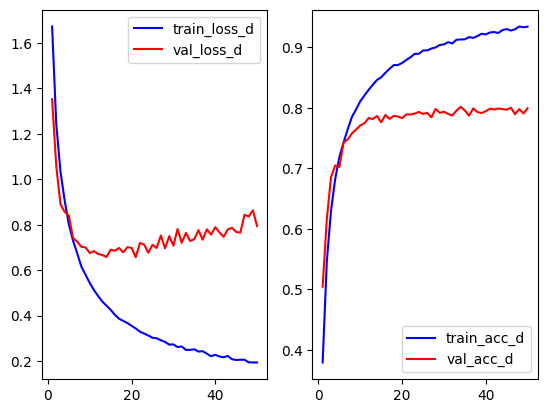

In [23]:
train_loss_d = history_d.history['loss']
val_loss_d = history_d.history['val_loss']
train_acc_d = history_d.history['acc']
val_acc_d = history_d.history['val_acc']

plt.subplot(1,2,1)
plt.plot(range(1,len(train_loss_d)+1),train_loss_d,color='blue',label='train_loss_d')
plt.plot(range(1,len(train_loss_d)+1),val_loss_d,color='red',label='val_loss_d')
plt.legend()

plt.subplot(1,2,2)
plt.plot(range(1,len(train_acc_d)+1),train_acc_d,color='blue',label='train_acc_d')
plt.plot(range(1,len(train_acc_d)+1),val_acc_d,color='red',label='val_acc_d')
plt.legend()
plt.show()

## 피쳐 값 저장

In [27]:
import tensorflow as tf

get_output = []

for layer in model.layers:
    get_output.append(layer.output)

layer_name = []
for layer in model.layers:
    layer_name.append(layer.name)

## 피쳐값 추출

In [29]:
test_img = np.reshape(X_train[0], (-1, 32, 32, 3))

visual_model = tf.keras.models.Model(inputs = model.input, outputs = get_output)
feature_maps = visual_model.predict(test_img)

1/1 [==============================] - 0s 464ms/step


In [31]:
feature_maps[0].shape
# 마지막꺼가 피쳐의 특징?

(1, 32, 32, 32)

## 특징 추출 (특징점 찾아보기)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


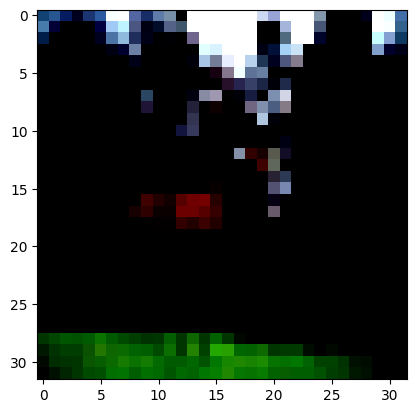

In [34]:
plt.imshow(X_train[0])

C:\Users\user\miniconda3\envs\meta\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


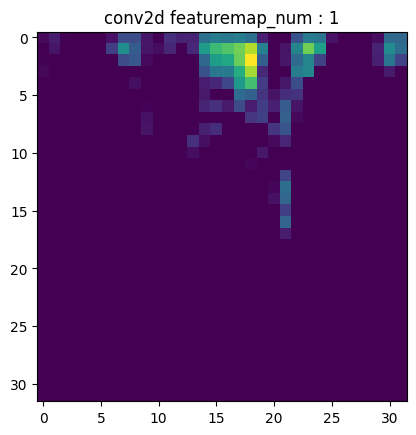

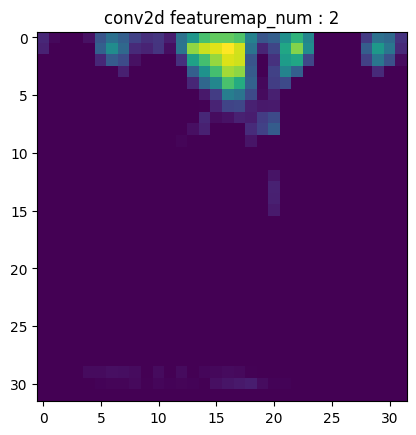

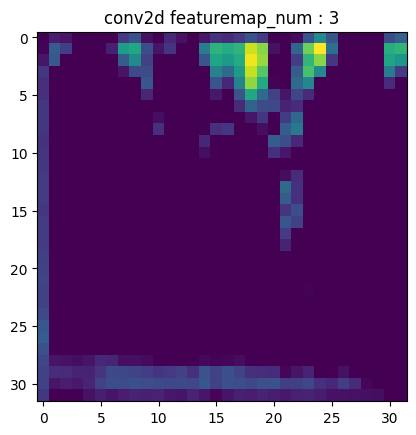

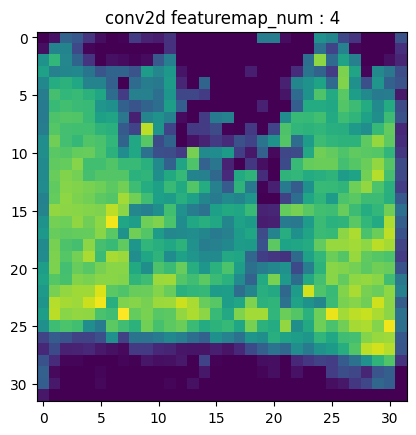

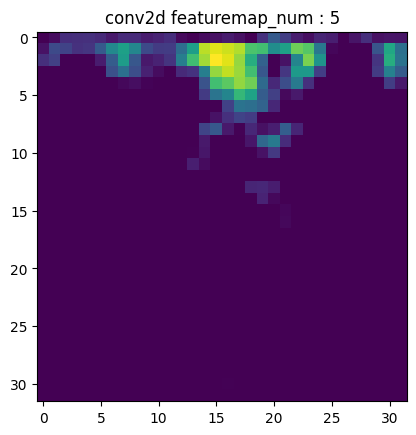

...

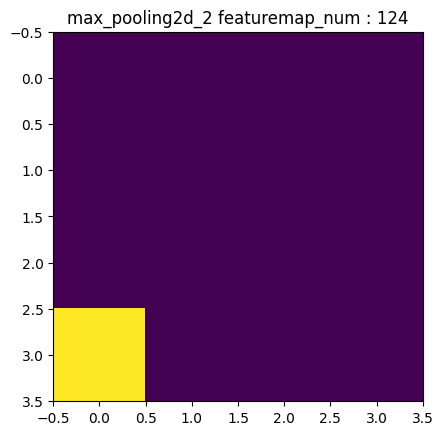

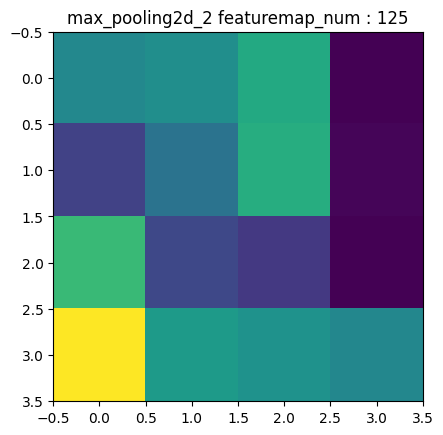

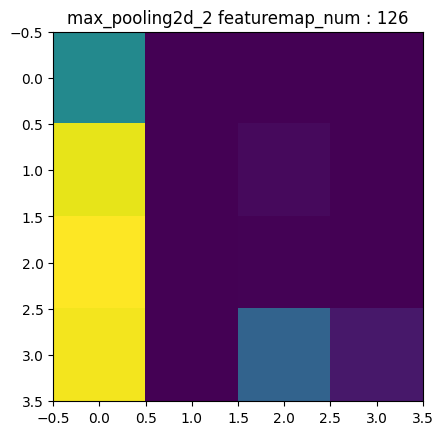

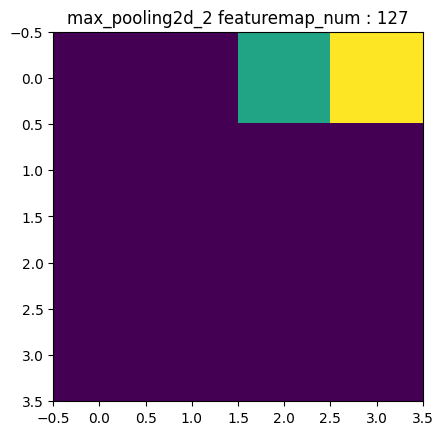

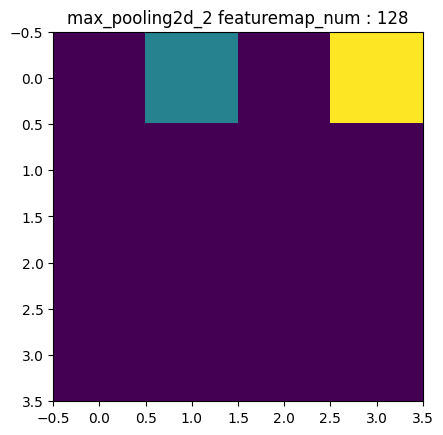

In [33]:
for layer_name, feature_map in zip(layer_name, feature_maps):
    if(len(feature_map.shape)==4):
        img_size = feature_map.shape[1]
        feature_size = feature_map.shape[-1]
        
        for temp in range(feature_size):
            x = feature_map[0,:,:,temp]
            plt.figure()
            plt.title(f'{layer_name} featuremap_num : {temp+1}')
            plt.imshow(x, cmap = 'viridis')

### 모델 저장하는 법

In [35]:
model.save('./test')

INFO:tensorflow:Assets written to: ./test\assets


INFO:tensorflow:Assets written to: ./test\assets


In [36]:
model.save('test.h5')

### 모델 불러오기

In [37]:
new_model = tf.keras.models.load_model('test.h5')

In [38]:
new_model

### weight 값만 저장

In [39]:
model.save_weights('test_weight')

In [40]:
new_model.load_weights('test_weight')